# Getting image data into Colab
*Author: Vedrana Andersen Dahl (vand@dtu.dk)*

This notebook shows some ways of loading, retrieving (and visualizing) image data in Colab. Check [Welcome To Colaboratory notebook](https://colab.research.google.com/#scrollTo=gJr_9dXGpJ05) for basic introduction to Colab.

## Loading images from internet

Probably the easiest is to load an image available on the internet, as we show in the following exaples. We load one image from the QIM data repository, and one image from Wikipedia. For very large images this is unpractical, as it takes a long time to load.

In [ ]:
# Load packages.
import numpy as np
import skimage.io
import matplotlib.pyplot as plt

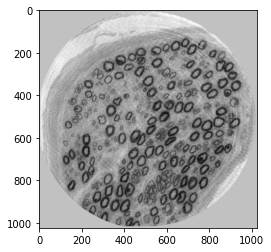

In [ ]:
# Load and visualize an image from QIM data repository.
url = 'https://qim.compute.dtu.dk/data-repository/InSegt_data/2D/NT2_0001.png'
image = skimage.io.imread(url)
plt.imshow(image, cmap=plt.cm.gray)
plt.show()

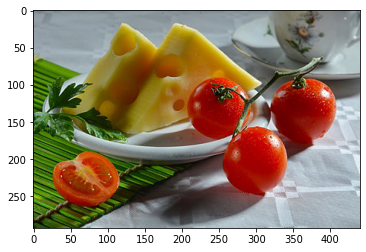

In [ ]:
# Load and visualize an image from Wikipedia.
url = 'https://upload.wikimedia.org/wikipedia/commons/thumb/6/62/Lotus_free.jpg/440px-Lotus_free.jpg'
url = 'https://upload.wikimedia.org/wikipedia/commons/thumb/e/e8/Cheese_and_Tomatoes.jpg/440px-Cheese_and_Tomatoes.jpg'
image = skimage.io.imread(url)
plt.imshow(image)
plt.show()

(293, 440, 3)


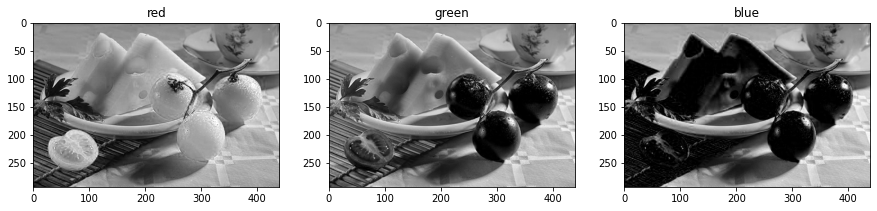

In [ ]:
# Visualize the three color channels of an RGB image
print(image.shape)
fig, ax = plt.subplots(1,3, figsize=(15,5))
ax[0].imshow(image[:,:,0], cmap=plt.cm.gray)
ax[0].set_title('red')
ax[1].imshow(image[:,:,1], cmap=plt.cm.gray)
ax[1].set_title('green')
ax[2].imshow(image[:,:,2], cmap=plt.cm.gray)
ax[2].set_title('blue')
plt.show()


## Loading volumes from internet
Tif volumes may also be loaded from the internet using a similar approach as images. However, this is practical only for rather small volumes.

Loading the volume...
Volume shape is: (150, 150, 150)
Volume data type is: uint8
Intensity range is: 25-223


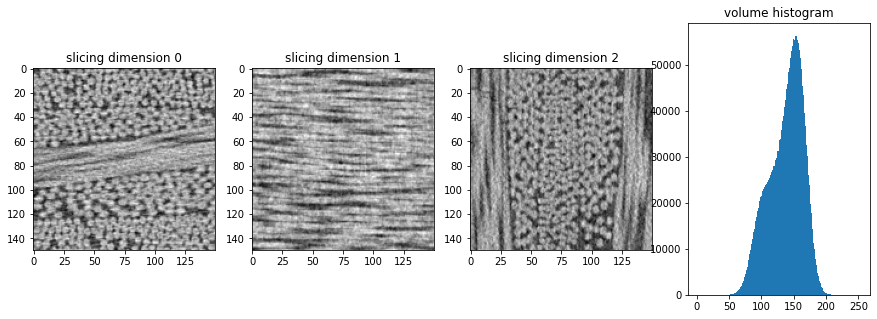

In [ ]:
# Load and visualize a volume from QIM data repository.
url = 'https://qim.compute.dtu.dk/data-repository/demo_data/multi_cube.tiff'
print('Loading the volume...')

vol = skimage.io.imread(url)

print(f'Volume shape is: {vol.shape}')
print(f'Volume data type is: {vol.dtype}')
print(f'Intensity range is: {vol.min()}-{vol.max()}')

fig, ax = plt.subplots(1, 4, figsize=(15,5))
ax[0].imshow(vol[vol.shape[0]//2], cmap=plt.cm.gray)
ax[0].set_title('slicing dimension 0')
ax[1].imshow(vol[:, vol.shape[1]//2, :], cmap=plt.cm.gray)
ax[1].set_title('slicing dimension 1')
ax[2].imshow(vol[:, :, vol.shape[2]//2], cmap=plt.cm.gray)
ax[2].set_title('slicing dimension 2')
ax[3].hist(vol.ravel(), np.arange(257)-0.5)
ax[3].set_title('volume histogram')
plt.show()

## Accessing images from your google drive (or your computer)

To access the images from your google drive, you need to mount the drive. This may be done using the Files tab of the left side-bar. You may also upload an file to session storage. 
Below I use python commands to mount the drive. However, this will not work for you as it points to a file in *my* drive.


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


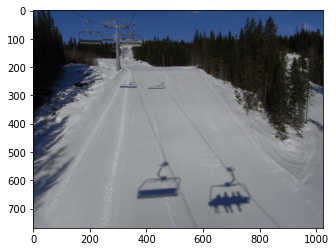

In [ ]:
# Load an image from my google drive.
from google.colab import drive
drive.mount('/content/drive')

image = skimage.io.imread('drive/MyDrive/Photos/Misc/RIMG0003.JPG')
plt.imshow(image)
plt.show()

## Retreiving images from internet 
Images from internet may also be loaded into your Colab session, instead of loading an image into the notebook runtime as show in first example. The difference is that the image will stay loaded for the whole session, even if you restart the runitme or change between notebooks. Beware that retreiving multiple times will create copies, so try doing it only once. Or check whether file exist using  `os.path.isfile`.

In [ ]:
# Retrieve volume from QIM data repository.
!wget 'https://qim.compute.dtu.dk/data-repository/InSegt_data/3D/nerves_part.tiff' -q

In [ ]:
import os
print(os.path.isfile('nerves_part.tiff'))

True


Volume shape is: (1024, 350, 350)
Volume data type is: uint8
Intensity range is: 0-236


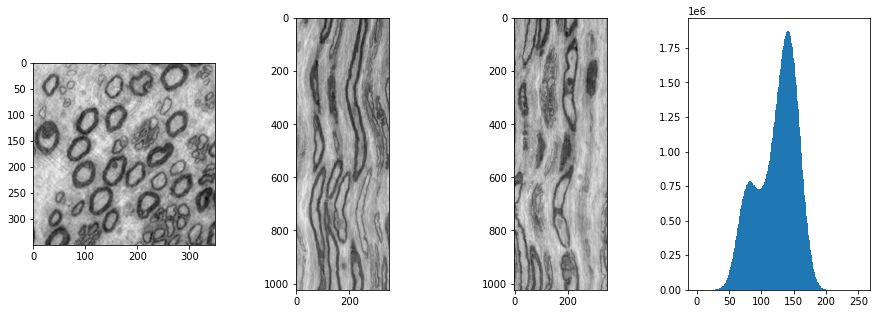

In [ ]:
# Load volume.
vol = skimage.io.imread('nerves_part.tiff')

print(f'Volume shape is: {vol.shape}')
print(f'Volume data type is: {vol.dtype}')
print(f'Intensity range is: {vol.min()}-{vol.max()}')

# Visualize volume slices and histogram
fig, ax = plt.subplots(1, 4, figsize=(15,5))
ax[0].imshow(vol[vol.shape[0]//2], cmap=plt.cm.gray)
ax[1].imshow(vol[:, vol.shape[1]//2, :], cmap=plt.cm.gray)
ax[2].imshow(vol[:, :, vol.shape[2]//2], cmap=plt.cm.gray)
ax[3].hist(vol.ravel(), np.arange(257)-0.5)
plt.show()

## Visualizing 3D volumes
Similar to retreiving images, you can also retreive code. For example, you can try this small module for 3D visualization using plotly.

In [ ]:
!wget 'https://raw.githubusercontent.com/vedranaa/goodies/main/volvizplotly.py' -q
from volvizplotly import volume_slicer
volume_slicer(vol[:400], ['ends','ends','ends'])

In [ ]:
volume_slicer(vol[:400], ['ends','ends','ends'])

## Another example, retrieve dataset from dropbox

In [ ]:
# Retreive MedNIST data set from dropbox.
!wget -q https://www.dropbox.com/s/5wwskxctvcxiuea/MedNIST.tar.gz

In [ ]:
# Unzip the '.tar.gz' file to the current directory
import tarfile
datafile = tarfile.open('MedNIST.tar.gz')
datafile.extractall()
datafile.close()

In [ ]:
# Get the subfolders of the data folder
import glob
folders = glob.glob('MedNIST/*/')
print(folders)

['MedNIST/ChestCT/', 'MedNIST/CXR/', 'MedNIST/Hand/', 'MedNIST/HeadCT/', 'MedNIST/BreastMRI/', 'MedNIST/AbdomenCT/']


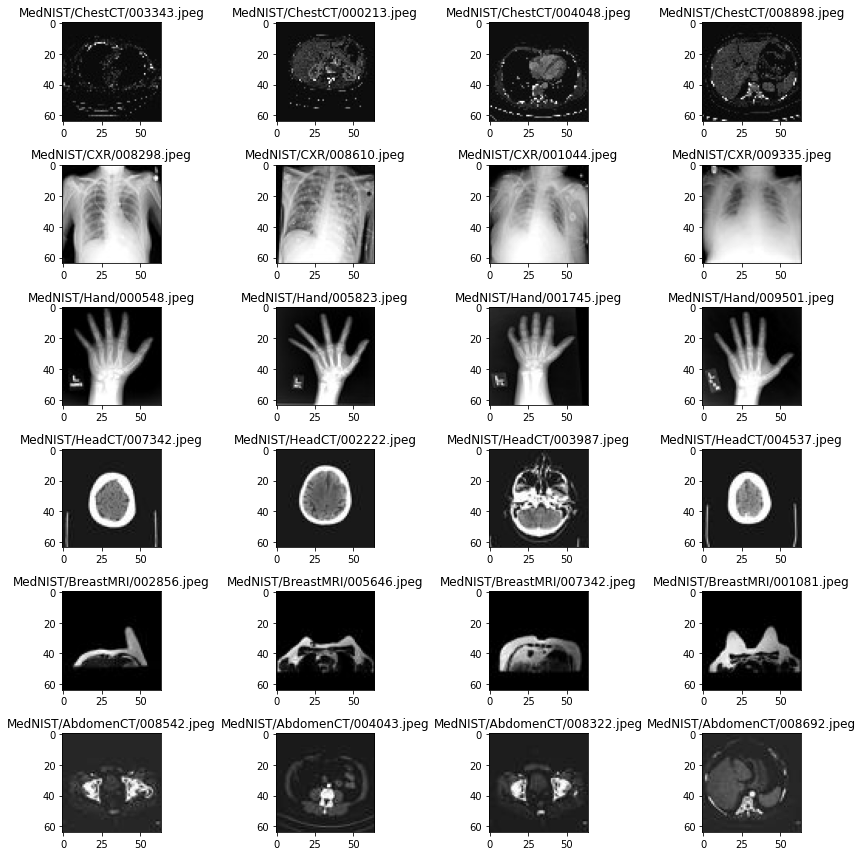

In [ ]:
# Visualize 4 random images from each folder 
fig, ax = plt.subplots(len(folders), 4, figsize=(12, 12))
for i, f in enumerate(folders):
  image_files = glob.glob(f + '/*.jpeg')
  rand_idx = np.random.choice(len(image_files), size=4, replace=False)
  for j, r in enumerate(rand_idx):
    ax[i, j].imshow(skimage.io.imread(image_files[r]), cmap=plt.cm.gray)
    ax[i, j].set_title(image_files[r])
plt.tight_layout()
plt.show()